## Imports

In [49]:
import xml.etree.ElementTree as ET
import pandas as pd
from IPython.display import display, HTML
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import requests
import os
from pathlib import Path
from time import sleep
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader
from torch.cuda.amp import GradScaler, autocast
from torchvision import models, transforms
import cv2
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import Subset
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.utils.class_weight import compute_class_weight
from matplotlib.colors import LogNorm


In [30]:

tree = ET.parse(r"C:\Users\emilm\OneDrive - University of Copenhagen\UNI Ting\4. år\Applied Machine Learning\FinalProject\CardDefs.xml")
root = tree.getroot()

records = []

for entity in root.findall("Entity"):
    row = {
        "CardID": entity.get("CardID"),
        "ID": entity.get("ID"),
        "version": entity.get("version"),
    }

    for tag in entity.findall("Tag"):
        name = tag.get("name")
        tag_type = tag.get("type")

        if tag_type == "LocString":
            # Grab the English text if available
            en = tag.find("enUS")
            row[name] = en.text.strip() if en is not None and en.text else None
        elif tag_type in ("Int", "String"):
            # Value is either an attribute or text content
            row[name] = tag.get("value") or tag.text
        else:
            row[name] = tag.get("value") or tag.text

    records.append(row)

df = pd.DataFrame(records)
print(df.shape)
print(df.head())

(34954, 2986)
                                  CardID      ID version  \
0        AIBot_DemonHunterTrainee_001_hb   91661       2   
1              AIBot_DruidTrainee_002_hb   91662       2   
2  AIBot_Event_Ragnaros_FireFestival_02m  104998       2   
3             AIBot_HunterTrainee_003_hb   91663       2   
4               AIBot_MageTrainee_004_hb   91664       2   

                 CARDNAME HEALTH CARD_SET CLASS FACTION CARDTYPE HERO_POWER  \
0     DemonHunter Trainee     30     1658    14       3        3      60224   
1           Druid Trainee     30     1658     2       3        3       1123   
2  Fire Festival Ragnaros     30       18     8       3        3      74588   
3          Hunter Trainee     30     1658     3       3        3        229   
4            Mage Trainee     30     1658     4       3        3        807   

   ... 2571 105687 40679 41672 40213 40950 IGNORE_SUPPRESS_MILL_ANIMATION  \
0  ...  NaN    NaN   NaN   NaN   NaN   NaN                            NaN

In [31]:
df

,CardID,ID,version,CARDNAME,HEALTH,CARD_SET,CLASS,FACTION,CARDTYPE,HERO_POWER,...,2571,105687,40679,41672,40213,40950,IGNORE_SUPPRESS_MILL_ANIMATION,SHIFTING_SPELL,38304,38681
0,AIBot_DemonHunterTrainee_001_hb,91661,2,DemonHunter Trainee,30,1658,14,3,3,60224,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AIBot_DruidTrainee_002_hb,91662,2,Druid Trainee,30,1658,2,3,3,1123,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AIBot_Event_Ragnaros_FireFestival_02m,104998,2,Fire Festival Ragnaros,30,18,8,3,3,74588,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,AIBot_HunterTrainee_003_hb,91663,2,Hunter Trainee,30,1658,3,3,3,229,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AIBot_MageTrainee_004_hb,91664,2,Mage Trainee,30,1658,4,3,3,807,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34949,YOP_031e,74925,2,Crabriding,NaN,1466,12,NaN,6,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34950,YOP_032,61970,2,Armor Vendor,3,1466,12,NaN,4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34951,YOP_033,61971,2,Backfire,NaN,1466,9,NaN,5,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34952,YOP_034,61972,2,Runaway Blackwing,10,1466,12,NaN,4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
threshold = 0.95
df_filtered = df.loc[:, df.isnull().mean() < threshold]
print(df_filtered.shape)
print(df_filtered.columns.tolist())

(34954, 29)
['CardID', 'ID', 'version', 'CARDNAME', 'HEALTH', 'CARD_SET', 'CLASS', 'FACTION', 'CARDTYPE', 'HERO_POWER', 'HIDE_WATERMARK', 'ARTISTNAME', 'RARITY', 'AttackVisualType', 'CARDTEXT', 'FLAVORTEXT', 'COST', 'COLLECTIBLE', 'SPELL_SCHOOL', 'ATK', 'CARDRACE', 'BATTLECRY', 'ELITE', 'TRIGGER_VISUAL', '1', 'TECH_LEVEL', 'TAG_SCRIPT_DATA_NUM_1', 'HIDE_COST', 'TAG_SCRIPT_DATA_NUM_2']


In [33]:
cols_to_keep = [
    "CardID", "ID",
    "CARDNAME", "CARDTEXT", "FLAVORTEXT",
    "COST", "ATK", "HEALTH",
    "CLASS", "CARDTYPE", "CARDRACE",
    "RARITY", "CARD_SET",
    "COLLECTIBLE",
    "BATTLECRY", "DEATHRATTLE", "INSPIRE",
    "SECRET", "COMBO", "CHARGE", "TAUNT",
    "DIVINE_SHIELD", "STEALTH", "POISONOUS",
    "SPELL_SCHOOL", "ELITE",
    "ARTISTNAME",
]

# Only keep columns that actually exist in the dataframe
cols_present = [c for c in cols_to_keep if c in df.columns]
df_clean = df[cols_present]
print(df_clean.shape)

(34954, 27)


In [34]:
df_clean_collectible = df_clean[df_clean["COLLECTIBLE"] == "1"].reset_index(drop=True)
print(df_clean_collectible.shape)

(7935, 27)


In [35]:
df_clean_collectible0 = df_clean_collectible.fillna(0)

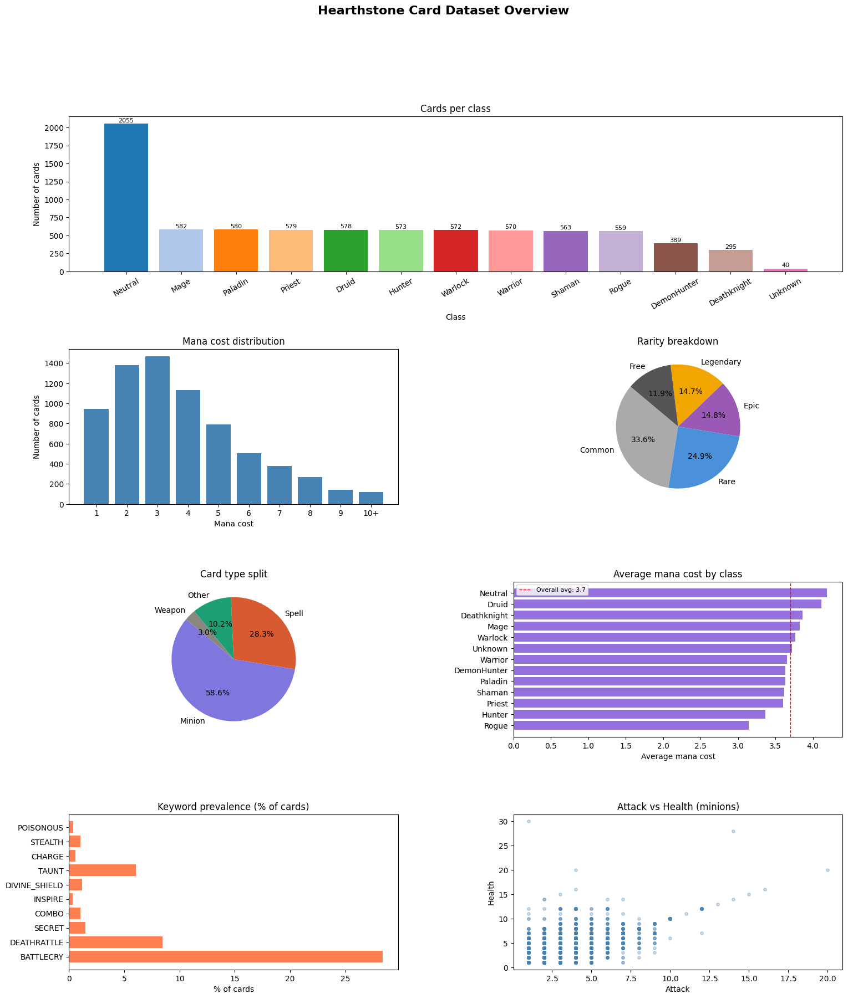

In [36]:

CLASS_MAP = {
    '1':'Deathknight','2':'Druid','3':'Hunter','4':'Mage','5':'Paladin',
    '6':'Priest','7':'Rogue','8':'Shaman','9':'Warlock','10':'Warrior',
    '12':'Neutral','14':'DemonHunter'
}
RARITY_MAP = {'1':'Common','2':'Free','3':'Rare','4':'Epic','5':'Legendary'}
TYPE_MAP = {'4':'Minion','5':'Spell','7':'Weapon'}

df = df_clean_collectible.copy()
df['CLASS'] = df['CLASS'].astype(str).map(CLASS_MAP).fillna('Unknown')
df['RARITY'] = df['RARITY'].astype(str).map(RARITY_MAP).fillna('Unknown')
df['CARDTYPE'] = df['CARDTYPE'].astype(str).map(TYPE_MAP).fillna('Other')
df['COST'] = pd.to_numeric(df['COST'], errors='coerce')
df['ATK'] = pd.to_numeric(df['ATK'], errors='coerce')
df['HEALTH'] = pd.to_numeric(df['HEALTH'], errors='coerce')

minions = df[df['CARDTYPE'] == 'Minion']

keywords = ['BATTLECRY','DEATHRATTLE','SECRET','COMBO','INSPIRE',
            'DIVINE_SHIELD','TAUNT','CHARGE','STEALTH','POISONOUS']
keywords = [k for k in keywords if k in df.columns]

fig = plt.figure(figsize=(18, 20))
fig.suptitle('Hearthstone Card Dataset Overview', fontsize=16, fontweight='bold', y=0.98)
gs = gridspec.GridSpec(4, 2, figure=fig, hspace=0.5, wspace=0.35)

# 1. Cards per class
ax1 = fig.add_subplot(gs[0, :])
class_counts = df['CLASS'].value_counts().sort_values(ascending=False)
bars = ax1.bar(class_counts.index, class_counts.values, color=plt.cm.tab20.colors[:len(class_counts)])
ax1.set_title('Cards per class')
ax1.set_xlabel('Class')
ax1.set_ylabel('Number of cards')
ax1.tick_params(axis='x', rotation=30)
for bar in bars:
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
             str(int(bar.get_height())), ha='center', va='bottom', fontsize=8)

# 2. Mana cost distribution
ax2 = fig.add_subplot(gs[1, 0])
cost_counts = df['COST'].dropna().astype(int).clip(upper=10)
cost_counts = cost_counts.value_counts().sort_index()
cost_counts.index = [str(i) if i < 10 else '10+' for i in cost_counts.index]
ax2.bar(cost_counts.index, cost_counts.values, color='steelblue')
ax2.set_title('Mana cost distribution')
ax2.set_xlabel('Mana cost')
ax2.set_ylabel('Number of cards')

# 3. Rarity breakdown
ax3 = fig.add_subplot(gs[1, 1])
rarity_counts = df['RARITY'].value_counts()
colors_rarity = ['#aaaaaa','#4a90d9','#9b59b6','#f0a500','#555555']
ax3.pie(rarity_counts.values, labels=rarity_counts.index, autopct='%1.1f%%',
        colors=colors_rarity[:len(rarity_counts)], startangle=140)
ax3.set_title('Rarity breakdown')

# 4. Card type split
ax4 = fig.add_subplot(gs[2, 0])
type_counts = df['CARDTYPE'].value_counts()
ax4.pie(type_counts.values, labels=type_counts.index, autopct='%1.1f%%',
        colors=['#7f77dd','#d85a30','#1d9e75','#888780'], startangle=140)
ax4.set_title('Card type split')

# 5. Average mana cost by class
ax5 = fig.add_subplot(gs[2, 1])
avg_mana = df.groupby('CLASS')['COST'].mean().sort_values()
ax5.barh(avg_mana.index, avg_mana.values, color='mediumpurple')
ax5.set_title('Average mana cost by class')
ax5.set_xlabel('Average mana cost')
ax5.axvline(avg_mana.mean(), color='red', linestyle='--', linewidth=1, label=f'Overall avg: {avg_mana.mean():.1f}')
ax5.legend(fontsize=8)

# 6. Keyword prevalence
ax6 = fig.add_subplot(gs[3, 0])
kw_pcts = [(df[k] != 0).mean() * 100 for k in keywords]
kw_pcts = [(pd.to_numeric(df[k], errors='coerce').fillna(0) != 0).mean() * 100 for k in keywords]
ax6.barh(keywords, kw_pcts, color='coral')
ax6.set_title('Keyword prevalence (% of cards)')
ax6.set_xlabel('% of cards')

# 7. Attack vs Health scatter (minions)
ax7 = fig.add_subplot(gs[3, 1])
ax7.scatter(minions['ATK'], minions['HEALTH'], alpha=0.3, s=15, color='steelblue')
ax7.set_title('Attack vs Health (minions)')
ax7.set_xlabel('Attack')
ax7.set_ylabel('Health')

#plt.savefig('hearthstone_overview.png', dpi=150, bbox_inches='tight')    # Save the figure if needed
plt.show()

## Clustering


Shape: (4646, 10)
Missing values:
COST             0
ATK              0
HEALTH           0
RARITY           0
BATTLECRY        0
DEATHRATTLE      0
TAUNT            0
DIVINE_SHIELD    0
SECRET           0
STEALTH          0
dtype: int64

Searching for best K...
  K= 2  Inertia=   34462.5  Silhouette=0.2280
  K= 3  Inertia=   29897.3  Silhouette=0.2447
  K= 4  Inertia=   25335.1  Silhouette=0.2677
  K= 5  Inertia=   22563.2  Silhouette=0.2533
  K= 6  Inertia=   18512.2  Silhouette=0.2752
  K= 7  Inertia=   15315.6  Silhouette=0.3110
  K= 8  Inertia=   13973.3  Silhouette=0.2960
  K= 9  Inertia=   12813.4  Silhouette=0.2966
  K=10  Inertia=   12108.0  Silhouette=0.3029
  K=11  Inertia=   11263.4  Silhouette=0.3032
  K=12  Inertia=   10480.7  Silhouette=0.3162
  K=13  Inertia=    9921.5  Silhouette=0.3019
  K=14  Inertia=    9459.3  Silhouette=0.3162
  K=15  Inertia=    8862.2  Silhouette=0.3149


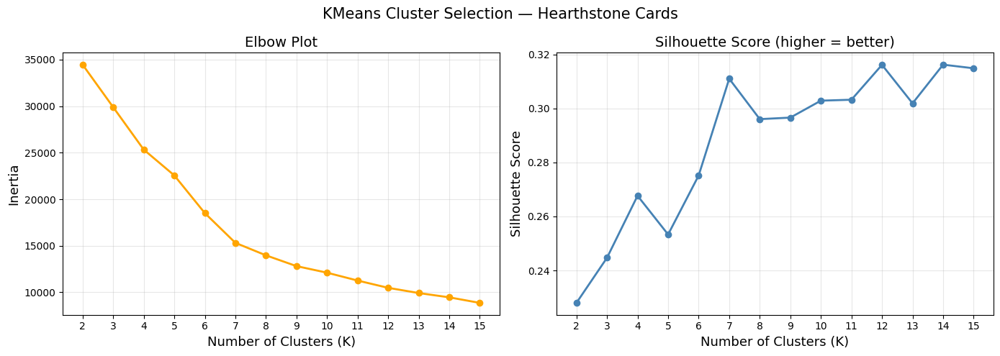

In [37]:
# ── Prepare data ───────────────────────────────────────────────────────────────
# Convert relevant columns to numeric
cluster_variables = ['COST', 'ATK', 'HEALTH', 'RARITY',
                     'BATTLECRY', 'DEATHRATTLE', 'TAUNT',
                     'DIVINE_SHIELD', 'SECRET', 'STEALTH']

X = df_clean_collectible[cluster_variables].copy()

# Only keep minions (CARDTYPE == '4') since ATK/HEALTH are meaningful for them
X = X[df_clean_collectible['CARDTYPE'].astype(str) == '4']

for col in cluster_variables:
    X[col] = pd.to_numeric(X[col], errors='coerce').fillna(0)

print(f"Shape: {X.shape}")
print(f"Missing values:\n{X.isnull().sum()}")

# ── Scale features ─────────────────────────────────────────────────────────────
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=cluster_variables)

# ── Elbow + silhouette ─────────────────────────────────────────────────────────
def find_best_clusters(df, max_k):
    inertias, silhouettes, k_values = [], [], []
    for k in range(2, max_k + 1):
        km = KMeans(n_clusters=k, random_state=42, n_init=10)
        km.fit(df)
        inertias.append(km.inertia_)
        silhouettes.append(silhouette_score(df, km.labels_, sample_size=2000, random_state=42))
        k_values.append(k)
        print(f"  K={k:2d}  Inertia={km.inertia_:10.1f}  Silhouette={silhouettes[-1]:.4f}")
    return inertias, silhouettes, k_values

print("\nSearching for best K...")
inertias, silhouettes, k_values = find_best_clusters(X_scaled, max_k=15)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(k_values, inertias, 'o-', color='orange', linewidth=2)
axes[0].set_xlabel('Number of Clusters (K)', size=13)
axes[0].set_xticks(k_values)
axes[0].set_ylabel('Inertia', size=13)
axes[0].set_title('Elbow Plot', size=14)
axes[0].grid(alpha=0.3)

axes[1].plot(k_values, silhouettes, 'o-', color='steelblue', linewidth=2)
axes[1].set_xlabel('Number of Clusters (K)', size=13)
axes[1].set_xticks(k_values)
axes[1].set_ylabel('Silhouette Score', size=13)
axes[1].set_title('Silhouette Score (higher = better)', size=14)
axes[1].grid(alpha=0.3)

plt.suptitle('KMeans Cluster Selection — Hearthstone Cards', size=15)
plt.tight_layout()
plt.show()




Fitting final model with K=7...

Cluster distribution (K=7):
  Cluster  0:   842 cards  (18.1%)
  Cluster  1:   443 cards  (9.5%)
  Cluster  2:  1239 cards  (26.7%)
  Cluster  3:  1475 cards  (31.7%)
  Cluster  4:    92 cards  (2.0%)
  Cluster  5:    83 cards  (1.8%)
  Cluster  6:   472 cards  (10.2%)


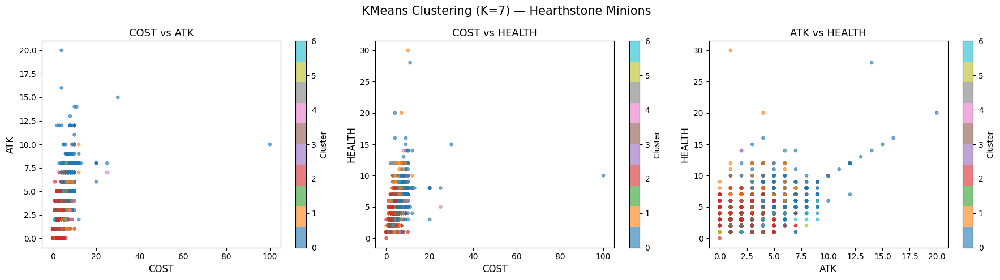

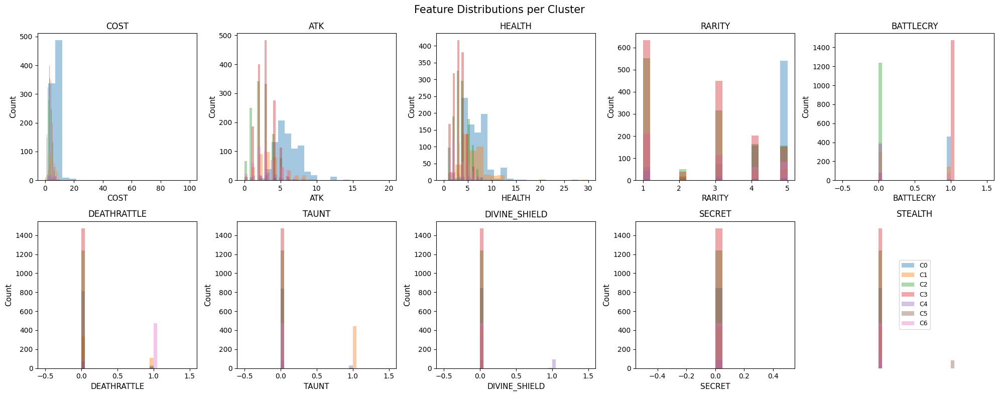


Cluster centroids (original scale):
         COST   ATK  HEALTH  RARITY  BATTLECRY  DEATHRATTLE  TAUNT  DIVINE_SHIELD  SECRET  STEALTH
cluster                                                                                           
0        7.30  6.04    6.86    4.31       0.55         0.03   0.00           0.00     0.0      0.0
1        4.98  3.58    5.90    2.34       0.32         0.24   1.00           0.00     0.0      0.0
2        3.06  2.45    3.62    2.45       0.00         0.00   0.00           0.00     0.0      0.0
3        3.22  2.85    3.13    2.46       1.00         0.00   0.00           0.00     0.0      0.0
4        4.71  3.27    3.52    2.61       0.14         0.11   0.34           1.00     0.0      0.0
5        3.10  2.73    2.83    2.35       0.05         0.13   0.01           0.02     0.0      1.0
6        3.52  3.15    2.99    2.58       0.16         1.00   0.00           0.00     0.0      0.0


In [38]:
# ── Fit final model ────────────────────────────────────────────────────────────
# Adjust after inspecting the plots above
chosen_k = 7

print(f"\nFitting final model with K={chosen_k}...")
kmeans_final = KMeans(n_clusters=chosen_k, random_state=42, n_init=10)
kmeans_final.fit(X_scaled)

labels = kmeans_final.labels_
X['cluster'] = labels

print(f"\nCluster distribution (K={chosen_k}):")
for i in range(chosen_k):
    n = (labels == i).sum()
    print(f"  Cluster {i:2d}: {n:5d} cards  ({100*n/len(labels):.1f}%)")

# ── 2D scatter projections ─────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
pairs = [('COST', 'ATK'), ('COST', 'HEALTH'), ('ATK', 'HEALTH')]

for ax, (xvar, yvar) in zip(axes, pairs):
    sc = ax.scatter(X[xvar], X[yvar], c=labels, cmap='tab10',
                    s=15, alpha=0.6)
    ax.set_xlabel(xvar, size=12)
    ax.set_ylabel(yvar, size=12)
    ax.set_title(f'{xvar} vs {yvar}', size=13)
    plt.colorbar(sc, ax=ax, label='Cluster')

plt.suptitle(f'KMeans Clustering (K={chosen_k}) — Hearthstone Minions', size=15)
plt.tight_layout()
plt.show()

# ── Feature distributions per cluster ─────────────────────────────────────────
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

for ax, var in zip(axes, cluster_variables):
    for i in range(chosen_k):
        subset = X[X['cluster'] == i][var]
        ax.hist(subset, bins=20, alpha=0.4, label=f'C{i}')
    ax.set_xlabel(var, size=11)
    ax.set_ylabel('Count', size=11)
    ax.set_title(f'{var}', size=12)

axes[-1].legend(*axes[0].get_legend_handles_labels(), loc='center', fontsize=9)
axes[-1].axis('off')
plt.suptitle('Feature Distributions per Cluster', size=15)
plt.tight_layout()
plt.show()

# ── Cluster mean stats (useful summary) ───────────────────────────────────────
print("\nCluster centroids (original scale):")
print(X.groupby('cluster')[cluster_variables].mean().round(2).to_string())

## CNN stuff

In [39]:

# ── Config ─────────────────────────────────────────────────────────────────────
ART_DIR = Path("card_art")
ART_DIR.mkdir(exist_ok=True)

# Use 'orig' for raw artwork (recommended for CNNs — no UI frame)
# Use 'render/latest/enUS/256x' for full card with frame
BASE_URL = "https://art.hearthstonejson.com/v1/256x/{card_id}.jpg"


card_ids = df_clean_collectible['CardID'].tolist()
print(f"Downloading art for {len(card_ids)} cards...")

# ── Download ───────────────────────────────────────────────────────────────────
failed = []

for card_id in tqdm(card_ids):
    out_path = ART_DIR / f"{card_id}.jpg"

    # Skip if already downloaded
    if out_path.exists():
        continue

    url = BASE_URL.format(card_id=card_id)
    try:
        r = requests.get(url, timeout=10)
        if r.status_code == 200:
            out_path.write_bytes(r.content)
        else:
            failed.append((card_id, r.status_code))
    except requests.RequestException as e:
        failed.append((card_id, str(e)))

    sleep(0.05)  # be polite to the server

print(f"\nDone. Downloaded: {len(list(ART_DIR.glob('*.jpg')))}")
print(f"Failed: {len(failed)}")
if failed:
    print("Failed card IDs:", failed)

100%|██████████| 7935/7935 [00:03<00:00, 2568.57it/s]


Done. Downloaded: 7926
Failed: 9
Failed card IDs: [('CORE_DMF_060', 404), ('CORE_EX1_316', 404), ('CORE_RLK_063', 404), ('CORE_RLK_086', 404), ('CORE_RLK_122', 404), ('CORE_RLK_506', 404), ('LEG_RLK_079', 404), ('LEG_RLK_744', 404), ('LEG_RLK_753', 404)]


In [40]:
# ── Device ─────────────────────────────────────────────────────────────────────
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Training on: {device}")
if device.type == 'cuda':
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

Training on: cuda
GPU: NVIDIA GeForce RTX 4050 Laptop GPU
Memory: 6.4 GB


In [41]:
class HearthstoneDataset(Dataset):
    def __init__(self, df, art_dir, label_col='CLASS', img_size=224, augment=False):
        self.art_dir = Path(art_dir)  # must be first, before any if/else

        if augment:
            self.transform = transforms.Compose([
                transforms.Resize((img_size, img_size)),

                # Existing
                transforms.RandomHorizontalFlip(),
                transforms.RandomRotation(15),
                transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
                transforms.RandomGrayscale(p=0.1),

                # Perspective / spatial distortion
                transforms.RandomPerspective(distortion_scale=0.2, p=0.3),

                # Randomly crop and resize — forces model to focus on parts of the image
                transforms.RandomResizedCrop(img_size, scale=(0.7, 1.0)),

                # Randomly erase a rectangle — prevents over-relying on one region
                transforms.ToTensor(),
                transforms.Normalize([0.485, 0.456, 0.406],
                                    [0.229, 0.224, 0.225]),
                transforms.RandomErasing(p=0.3, scale=(0.02, 0.2)),
            ])
        else:
            self.transform = transforms.Compose([
                transforms.Resize((img_size, img_size)),
                transforms.ToTensor(),
                transforms.Normalize([0.485, 0.456, 0.406],
                                     [0.229, 0.224, 0.225])
            ])

        # Only keep rows where image exists
        self.df = df[df['CardID'].apply(
            lambda cid: (self.art_dir / f"{cid}.jpg").exists()
        )].reset_index(drop=True)

        # Drop rows with missing or invalid class
        self.df = self.df[self.df[label_col].astype(str) != '0']
        self.df = self.df[self.df[label_col].astype(str) != 'nan']
        self.df = self.df[self.df[label_col].notna()]
        self.df = self.df.reset_index(drop=True)

        # Encode labels with LabelEncoder
        self.le = LabelEncoder()
        self.df['label'] = self.le.fit_transform(self.df[label_col].astype(str))

        print(f"Dataset size: {len(self.df)} cards")
        print(f"Classes ({len(self.le.classes_)}): {self.le.classes_}")
        print(f"Label range: {self.df['label'].min()} to {self.df['label'].max()}")

        # Cache all images in RAM
        print("Caching images in RAM...")
        self.cache = {}
        for card_id in tqdm(self.df['CardID'], unit='img'):
            img_path = self.art_dir / f"{card_id}.jpg"
            img = cv2.imread(str(img_path))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            self.cache[card_id] = Image.fromarray(img)
        print("Caching done!")

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = self.cache[row['CardID']]
        return self.transform(img), row['label']

In [42]:
# ── Build dataloaders ──────────────────────────────────────────────────────────

# Split indices first, then build separate datasets
from torch.utils.data import Subset

full_dataset = HearthstoneDataset(df_clean_collectible, art_dir='card_art', label_col='CLASS')

train_size = int(0.8 * len(full_dataset))
val_size   = len(full_dataset) - train_size
train_indices, val_indices = torch.utils.data.random_split(
    range(len(full_dataset)), [train_size, val_size]
)

train_dataset = HearthstoneDataset(df_clean_collectible, art_dir='card_art',
                                    label_col='CLASS', augment=True)
val_dataset   = HearthstoneDataset(df_clean_collectible, art_dir='card_art',
                                    label_col='CLASS', augment=False)

train_dataset.df = full_dataset.df.iloc[list(train_indices)].reset_index(drop=True)
val_dataset.df   = full_dataset.df.iloc[list(val_indices)].reset_index(drop=True)
train_dataset.cache = full_dataset.cache
val_dataset.cache   = full_dataset.cache
train_dataset.le    = full_dataset.le
val_dataset.le      = full_dataset.le

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True,  num_workers=0, pin_memory=False)
val_loader   = DataLoader(val_dataset,   batch_size=64, shuffle=False, num_workers=0, pin_memory=False)

Dataset size: 7886 cards
Classes (12): ['1' '10' '12' '14' '2' '3' '4' '5' '6' '7' '8' '9']
Label range: 0 to 11
Caching images in RAM...


100%|██████████| 7886/7886 [01:01<00:00, 127.80img/s]


Caching done!
Dataset size: 7886 cards
Classes (12): ['1' '10' '12' '14' '2' '3' '4' '5' '6' '7' '8' '9']
Label range: 0 to 11
Caching images in RAM...


100%|██████████| 7886/7886 [00:10<00:00, 723.77img/s]


Caching done!
Dataset size: 7886 cards
Classes (12): ['1' '10' '12' '14' '2' '3' '4' '5' '6' '7' '8' '9']
Label range: 0 to 11
Caching images in RAM...


100%|██████████| 7886/7886 [00:09<00:00, 839.56img/s]


Caching done!


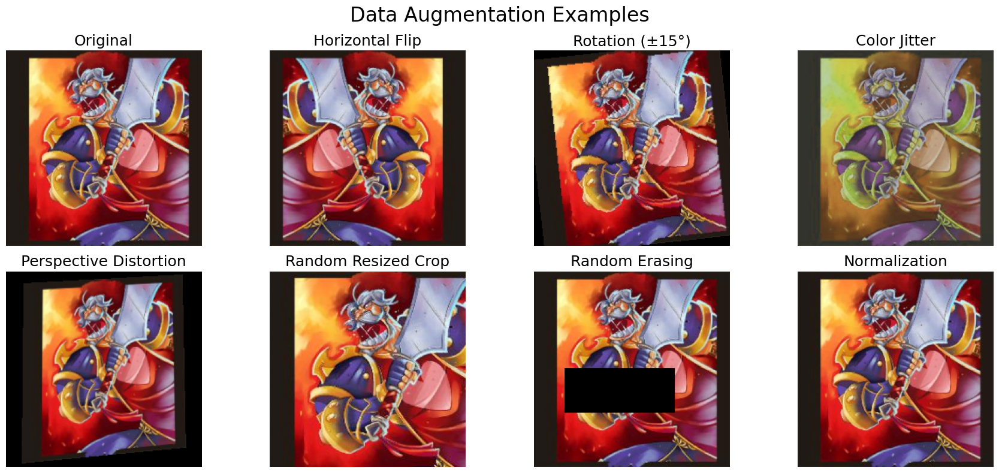

In [43]:
# Augmentation examples

# Pick any card image from cache
card_id = "EX1_116"
img = full_dataset.cache[card_id]

# ImageNet normalization values
mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]

def tensor_to_image(tensor):
    img = tensor.clone().cpu()
    for c in range(3):
        img[c] = img[c] * std[c] + mean[c]
    img = img.permute(1, 2, 0).numpy()
    return np.clip(img, 0, 1)

# Only KEEP relevant augmentations
augmentations = [
    ("Original",
     transforms.Compose([
         transforms.Resize((224,224)),
         transforms.ToTensor()
     ])),

    ("Horizontal Flip",
     transforms.Compose([
         transforms.Resize((224,224)),
         transforms.RandomHorizontalFlip(p=1.0),
         transforms.ToTensor()
     ])),

    ("Rotation (±15°)",
     transforms.Compose([
         transforms.Resize((224,224)),
         transforms.RandomRotation(15),
         transforms.ToTensor()
     ])),

    ("Color Jitter",
     transforms.Compose([
         transforms.Resize((224,224)),
         transforms.ColorJitter(
             brightness=0.3,
             contrast=0.3,
             saturation=0.3,
             hue=0.1
         ),
         transforms.ToTensor()
     ])),

    ("Perspective Distortion",
     transforms.Compose([
         transforms.Resize((224,224)),
         transforms.RandomPerspective(
             distortion_scale=0.2,
             p=1.0
         ),
         transforms.ToTensor()
     ])),

    ("Random Resized Crop",
     transforms.Compose([
         transforms.RandomResizedCrop(
             224,
             scale=(0.7, 1.0)
         ),
         transforms.ToTensor()
     ])),

    ("Random Erasing",
     transforms.Compose([
         transforms.Resize((224,224)),
         transforms.ToTensor(),
         transforms.RandomErasing(
             p=1.0,
             scale=(0.02, 0.2)
         )
     ])),

    ("Normalization",
     transforms.Compose([
         transforms.Resize((224,224)),
         transforms.ToTensor(),
         transforms.Normalize(mean, std)
     ])),
]

# 2 rows x 4 columns
fig, axes = plt.subplots(2, 4, figsize=(18, 8))
axes = axes.flatten()

for ax, (title, transform) in zip(axes, augmentations):
    transformed = transform(img)

    if transformed.ndim == 3:
        display_img = transformed

        if "Normalization" in title:
            display_img = tensor_to_image(display_img)
        else:
            display_img = display_img.permute(1, 2, 0).numpy()

        ax.imshow(np.clip(display_img, 0, 1))

    ax.set_title(title, fontsize=18)
    ax.axis("off")

plt.suptitle("Data Augmentation Examples", fontsize=24)
plt.tight_layout()
plt.show()

In [44]:
# ── Model ──────────────────────────────────────────────────────────────────────
num_classes = len(full_dataset.le.classes_)
print(f"num_classes: {num_classes}")

model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
model.fc = nn.Sequential(
    nn.Dropout(p=0.4),
    nn.Linear(model.fc.in_features, num_classes)
)
model = model.to(device)

# ── Training config ────────────────────────────────────────────────────────────
# Weights to handle class imbalance (especially downweighting Neutral)
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(full_dataset.df['label']),
    y=full_dataset.df['label'].values
)

weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

# Find the Neutral index and heavily downweight it
neutral_idx = list(full_dataset.le.classes_).index('12')  # '12' is Neutral
print(f"Neutral class index: {neutral_idx}, current weight: {weights_tensor[neutral_idx]:.4f}")

# Reduce Neutral weight to a fraction of its current value
weights_tensor[neutral_idx] *= 0.5  # try 0.1, 0.05, even 0.01

# Get all weights except Neutral
non_neutral_weights = torch.cat([weights_tensor[:neutral_idx], weights_tensor[neutral_idx+1:]])

print(f"Neutral weight set to: {weights_tensor[neutral_idx]:.4f}")
print(f"Non-neutral weights range: {non_neutral_weights.min():.4f} to {non_neutral_weights.max():.4f}")

criterion = nn.CrossEntropyLoss(weight=weights_tensor)

#Other hyperparameters
num_epochs = 45

optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=num_epochs
)
scaler = torch.amp.GradScaler('cuda')

train_losses, val_losses = [], []
train_accs,   val_accs   = [], []

num_classes: 12
Neutral class index: 2, current weight: 0.3198
Neutral weight set to: 0.1599
Non-neutral weights range: 1.1292 to 2.2818


In [45]:
best_val_acc = 0.0
best_epoch = 0

✓ New best model saved! Val Acc: 22.88% (Epoch 1)
Epoch  1/45  Train loss: 2.5052  acc: 12.4%  |  Val loss: 2.2622  acc: 22.9%  |  LR: 0.000300


Epoch  2/45  Train loss: 2.2657  acc: 18.0%  |  Val loss: 2.1771  acc: 20.7%  |  LR: 0.000299


Epoch  3/45  Train loss: 2.1455  acc: 22.2%  |  Val loss: 2.1906  acc: 22.3%  |  LR: 0.000297


Epoch  4/45  Train loss: 2.0169  acc: 25.2%  |  Val loss: 2.2759  acc: 20.1%  |  LR: 0.000294


✓ New best model saved! Val Acc: 23.38% (Epoch 5)
Epoch  5/45  Train loss: 1.8786  acc: 29.4%  |  Val loss: 2.3473  acc: 23.4%  |  LR: 0.000291


✓ New best model saved! Val Acc: 24.14% (Epoch 6)
Epoch  6/45  Train loss: 1.7861  acc: 31.8%  |  Val loss: 2.3974  acc: 24.1%  |  LR: 0.000287


Epoch  7/45  Train loss: 1.6606  acc: 35.7%  |  Val loss: 2.6690  acc: 20.0%  |  LR: 0.000282


Epoch  8/45  Train loss: 1.5354  acc: 39.0%  |  Val loss: 2.5908  acc: 23.4%  |  LR: 0.000277


Epoch  9/45  Train loss: 1.4095  acc: 43.2%  |  Val loss: 2.6788  acc: 22.6%  |  LR: 0.000271


✓ New best model saved! Val Acc: 27.50% (Epoch 10)
Epoch 10/45  Train loss: 1.2823  acc: 47.6%  |  Val loss: 2.5105  acc: 27.5%  |  LR: 0.000265


Epoch 11/45  Train loss: 1.1414  acc: 50.9%  |  Val loss: 2.5485  acc: 25.8%  |  LR: 0.000258


✓ New best model saved! Val Acc: 30.54% (Epoch 12)
Epoch 12/45  Train loss: 1.0614  acc: 52.2%  |  Val loss: 2.6899  acc: 30.5%  |  LR: 0.000250


✓ New best model saved! Val Acc: 30.99% (Epoch 13)
Epoch 13/45  Train loss: 0.9595  acc: 55.6%  |  Val loss: 2.7372  acc: 31.0%  |  LR: 0.000242


Epoch 14/45  Train loss: 0.8401  acc: 59.6%  |  Val loss: 2.7333  acc: 29.6%  |  LR: 0.000234


✓ New best model saved! Val Acc: 31.12% (Epoch 15)
Epoch 15/45  Train loss: 0.7629  acc: 63.0%  |  Val loss: 3.0641  acc: 31.1%  |  LR: 0.000225


✓ New best model saved! Val Acc: 34.16% (Epoch 16)
Epoch 16/45  Train loss: 0.6776  acc: 65.0%  |  Val loss: 3.0007  acc: 34.2%  |  LR: 0.000216


Epoch 17/45  Train loss: 0.6088  acc: 68.0%  |  Val loss: 2.9426  acc: 33.3%  |  LR: 0.000206


✓ New best model saved! Val Acc: 36.95% (Epoch 18)
Epoch 18/45  Train loss: 0.5526  acc: 70.2%  |  Val loss: 3.0044  acc: 36.9%  |  LR: 0.000196


✓ New best model saved! Val Acc: 40.49% (Epoch 19)
Epoch 19/45  Train loss: 0.4841  acc: 72.9%  |  Val loss: 2.8681  acc: 40.5%  |  LR: 0.000186


✓ New best model saved! Val Acc: 40.62% (Epoch 20)
Epoch 20/45  Train loss: 0.4394  acc: 74.5%  |  Val loss: 2.7571  acc: 40.6%  |  LR: 0.000176


✓ New best model saved! Val Acc: 41.95% (Epoch 21)
Epoch 21/45  Train loss: 0.4167  acc: 76.4%  |  Val loss: 2.9636  acc: 42.0%  |  LR: 0.000166


✓ New best model saved! Val Acc: 43.47% (Epoch 22)
Epoch 22/45  Train loss: 0.3389  acc: 79.2%  |  Val loss: 2.8829  acc: 43.5%  |  LR: 0.000155


✓ New best model saved! Val Acc: 44.11% (Epoch 23)
Epoch 23/45  Train loss: 0.3304  acc: 79.5%  |  Val loss: 3.0143  acc: 44.1%  |  LR: 0.000145


Epoch 24/45  Train loss: 0.2930  acc: 81.2%  |  Val loss: 3.0342  acc: 43.9%  |  LR: 0.000134


Epoch 25/45  Train loss: 0.2999  acc: 82.1%  |  Val loss: 3.0631  acc: 42.8%  |  LR: 0.000124


✓ New best model saved! Val Acc: 44.42% (Epoch 26)
Epoch 26/45  Train loss: 0.2557  acc: 83.7%  |  Val loss: 3.0762  acc: 44.4%  |  LR: 0.000114


✓ New best model saved! Val Acc: 45.37% (Epoch 27)
Epoch 27/45  Train loss: 0.2553  acc: 84.6%  |  Val loss: 3.1062  acc: 45.4%  |  LR: 0.000104


Epoch 28/45  Train loss: 0.2327  acc: 85.3%  |  Val loss: 3.1779  acc: 44.7%  |  LR: 0.000094


✓ New best model saved! Val Acc: 46.83% (Epoch 29)
Epoch 29/45  Train loss: 0.2163  acc: 86.5%  |  Val loss: 3.1776  acc: 46.8%  |  LR: 0.000084


Epoch 30/45  Train loss: 0.1883  acc: 87.7%  |  Val loss: 3.2661  acc: 46.5%  |  LR: 0.000075


Epoch 31/45  Train loss: 0.1890  acc: 87.6%  |  Val loss: 3.1373  acc: 46.4%  |  LR: 0.000066


Epoch 32/45  Train loss: 0.1752  acc: 88.9%  |  Val loss: 3.1737  acc: 46.4%  |  LR: 0.000058


Epoch 33/45  Train loss: 0.1593  acc: 89.7%  |  Val loss: 3.2171  acc: 46.3%  |  LR: 0.000050


Epoch 34/45  Train loss: 0.1596  acc: 89.7%  |  Val loss: 3.1425  acc: 46.5%  |  LR: 0.000042


Epoch 35/45  Train loss: 0.1337  acc: 91.6%  |  Val loss: 3.2144  acc: 46.4%  |  LR: 0.000035


✓ New best model saved! Val Acc: 47.66% (Epoch 36)
Epoch 36/45  Train loss: 0.1377  acc: 90.9%  |  Val loss: 3.1834  acc: 47.7%  |  LR: 0.000029


Epoch 37/45  Train loss: 0.1290  acc: 91.9%  |  Val loss: 3.2738  acc: 47.4%  |  LR: 0.000023


Epoch 38/45  Train loss: 0.1142  acc: 92.4%  |  Val loss: 3.2227  acc: 47.5%  |  LR: 0.000018


Epoch 39/45  Train loss: 0.1233  acc: 92.6%  |  Val loss: 3.2657  acc: 47.3%  |  LR: 0.000013


Epoch 40/45  Train loss: 0.1298  acc: 92.0%  |  Val loss: 3.2409  acc: 47.5%  |  LR: 0.000009


Epoch 41/45  Train loss: 0.1159  acc: 92.1%  |  Val loss: 3.2609  acc: 47.3%  |  LR: 0.000006


Epoch 42/45  Train loss: 0.1146  acc: 92.5%  |  Val loss: 3.2429  acc: 47.4%  |  LR: 0.000003


Epoch 43/45  Train loss: 0.1226  acc: 92.7%  |  Val loss: 3.2452  acc: 46.9%  |  LR: 0.000001


Epoch 44/45  Train loss: 0.1203  acc: 91.9%  |  Val loss: 3.2443  acc: 47.3%  |  LR: 0.000000


Epoch 45/45  Train loss: 0.1145  acc: 92.5%  |  Val loss: 3.2378  acc: 47.5%  |  LR: 0.000000


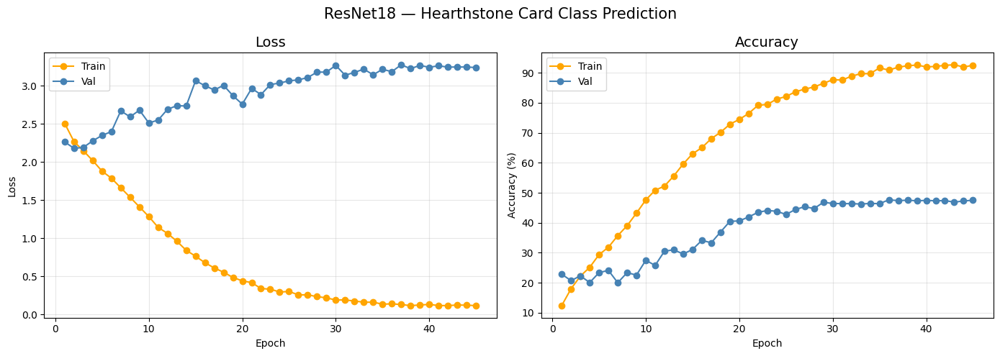

Model saved.


In [46]:


# ── Training loop ──────────────────────────────────────────────────────────────
for epoch in range(num_epochs):

    # ── Train ──────────────────────────────────────────────────────────────────
    model.train()
    running_loss, correct, total = 0, 0, 0

    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1:2d}/{num_epochs} [Train]",
                leave=False, unit='batch')

    for imgs, labels in pbar:
        imgs, labels = imgs.to(device, non_blocking=True), labels.to(device, non_blocking=True)

        optimizer.zero_grad()

        with torch.amp.autocast('cuda'):                        # mixed precision
            outputs = model(imgs)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        correct += (outputs.argmax(1) == labels).sum().item()
        total   += labels.size(0)

        pbar.set_postfix({
            'loss': f"{running_loss / (pbar.n + 1):.4f}",
            'acc':  f"{100 * correct / total:.1f}%"
        })

    train_losses.append(running_loss / len(train_loader))
    train_accs.append(100 * correct / total)

    # ── Validate ───────────────────────────────────────────────────────────────
    model.eval()
    running_loss, correct, total = 0, 0, 0

    pbar = tqdm(val_loader, desc=f"Epoch {epoch+1:2d}/{num_epochs} [Val]  ",
                leave=False, unit='batch')

    with torch.no_grad():
        for imgs, labels in pbar:
            imgs, labels = imgs.to(device, non_blocking=True), labels.to(device, non_blocking=True)

            with torch.amp.autocast('cuda'):
                outputs = model(imgs)
                loss = criterion(outputs, labels)

            running_loss += loss.item()
            correct += (outputs.argmax(1) == labels).sum().item()
            total   += labels.size(0)

            pbar.set_postfix({
                'loss': f"{running_loss / (pbar.n + 1):.4f}",
                'acc':  f"{100 * correct / total:.1f}%"
            })

    val_losses.append(running_loss / len(val_loader))
    val_accs.append(100 * correct / total)

    current_val_acc = 100 * correct / total

    if current_val_acc > best_val_acc:
        best_val_acc = current_val_acc
        best_epoch = epoch + 1

        torch.save(model.state_dict(), "hearthstone_resnet18_best.pth")

        print(f"✓ New best model saved! "
            f"Val Acc: {best_val_acc:.2f}% "
            f"(Epoch {best_epoch})")

    scheduler.step()

    print(f"Epoch {epoch+1:2d}/{num_epochs}  "
          f"Train loss: {train_losses[-1]:.4f}  acc: {train_accs[-1]:.1f}%  |  "
          f"Val loss: {val_losses[-1]:.4f}  acc: {val_accs[-1]:.1f}%  |  "
          f"LR: {scheduler.get_last_lr()[0]:.6f}")


# ── Plot results ───────────────────────────────────────────────────────────────
epochs = range(1, num_epochs + 1)
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(epochs, train_losses, 'o-', color='orange',    label='Train')
axes[0].plot(epochs, val_losses,   'o-', color='steelblue', label='Val')
axes[0].set_title('Loss', size=14)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(epochs, train_accs, 'o-', color='orange',    label='Train')
axes[1].plot(epochs, val_accs,   'o-', color='steelblue', label='Val')
axes[1].set_title('Accuracy', size=14)
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy (%)')
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.suptitle('ResNet18 — Hearthstone Card Class Prediction', size=15)
plt.tight_layout()
plt.savefig('training_results.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Save model ─────────────────────────────────────────────────────────────────
torch.save(model.state_dict(), 'hearthstone_resnet18.pth')
print("Model saved.")

## CNN plots

In [47]:
# Load best checkpoint
model.load_state_dict(torch.load("hearthstone_resnet18_best.pth"))
model.eval()

print("Loaded best checkpoint")

Loaded best checkpoint


C:\Users\emilm\AppData\Local\Temp\ipykernel_24036\3042288204.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("hearthstone_resnet18_best.

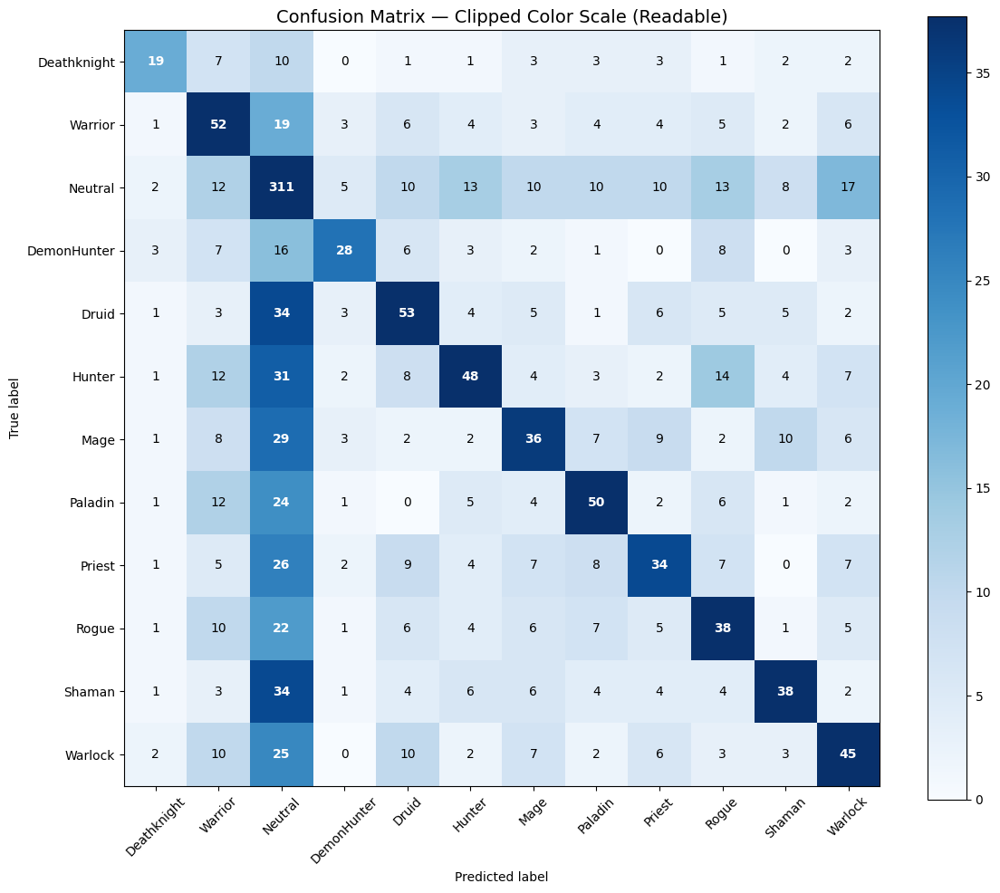

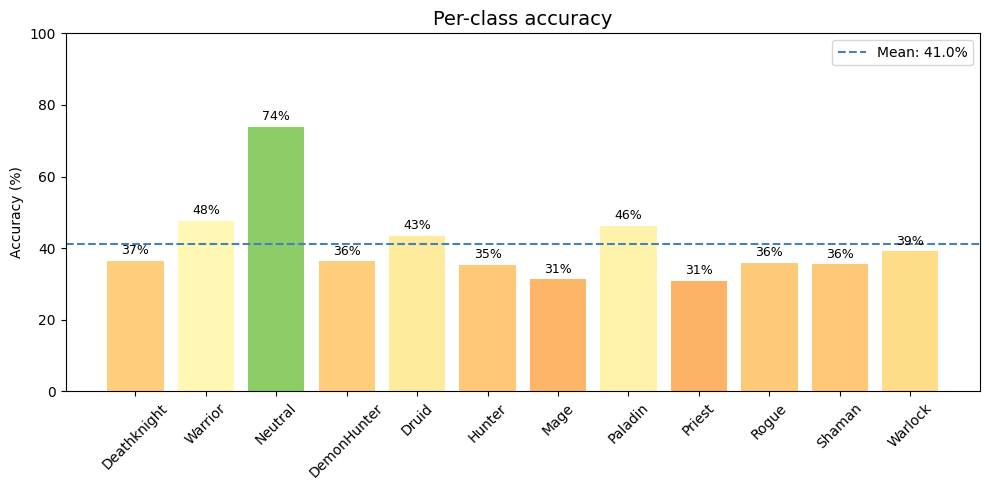

Total misclassified: 826 / 1578


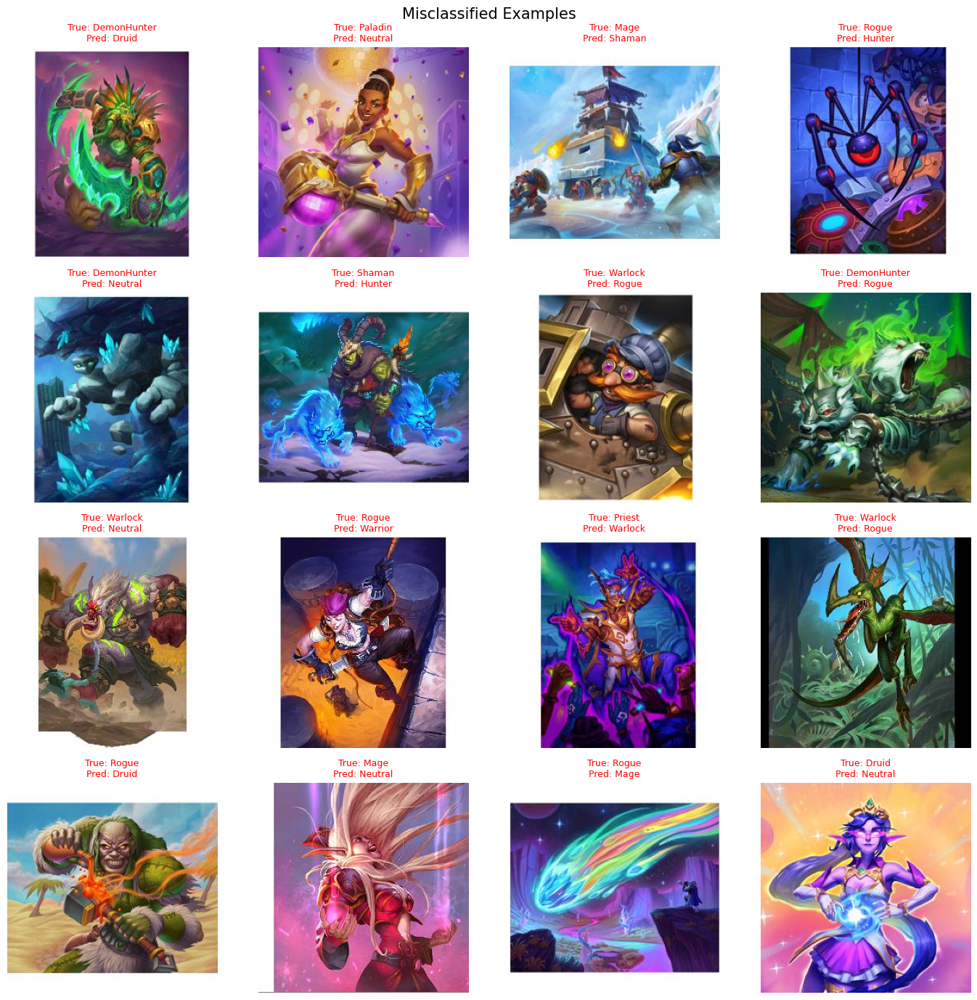


Top 10 most confused class pairs (true → predicted):
           Shaman → Neutral          34 times
            Druid → Neutral          34 times
           Hunter → Neutral          31 times
             Mage → Neutral          29 times
           Priest → Neutral          26 times
          Warlock → Neutral          25 times
          Paladin → Neutral          24 times
            Rogue → Neutral          22 times
          Warrior → Neutral          19 times
          Neutral → Warlock          17 times


In [55]:

# ── Get all predictions on validation set ──────────────────────────────────────
model.eval()
all_preds, all_labels, all_imgs, all_card_ids = [], [], [], []

with torch.no_grad():
    for imgs, labels in val_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        with torch.amp.autocast('cuda'):
            outputs = model(imgs)
        preds = outputs.argmax(1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_preds  = np.array(all_preds)
all_labels = np.array(all_labels)

class_names = full_dataset.le.classes_

CLASS_MAP = {
    '1':'Deathknight','2':'Druid','3':'Hunter','4':'Mage','5':'Paladin',
    '6':'Priest','7':'Rogue','8':'Shaman','9':'Warlock','10':'Warrior',
    '12':'Neutral','14':'DemonHunter'
}

# Map numeric class codes to readable names
class_names_raw = full_dataset.le.classes_
class_names = [CLASS_MAP.get(c, c) for c in class_names_raw]


# ── 1. Confusion matrix ────────────────────────────────────────────────────────

cm = confusion_matrix(all_labels, all_preds)

vmax = np.percentile(cm, 95)    # Clip extreme values for color balance

fig, ax = plt.subplots(figsize=(12, 10))
disp = ConfusionMatrixDisplay(cm, display_labels=class_names)

disp.plot(
    ax=ax,
    cmap='Blues',
    colorbar=False,
    values_format='d',
    xticks_rotation=45
)

disp.im_.set_clim(vmin=0, vmax=vmax)    # Apply clipping
fig.colorbar(disp.im_, ax=ax)   # Add colorbar

# FIX readable annotations
threshold = vmax / 2

for text, value in zip(ax.texts, cm.flatten()):
    if value > threshold:
        text.set_color('white')
        text.set_fontweight('bold')
    else:
        text.set_color('black')

ax.set_title('Confusion Matrix — Clipped Color Scale (Readable)', size=14)
plt.tight_layout()
plt.show()

# ── 2. Per-class accuracy ──────────────────────────────────────────────────────
per_class_acc = cm.diagonal() / cm.sum(axis=1) * 100

fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.bar(class_names, per_class_acc, color=plt.cm.RdYlGn(per_class_acc / 100))
ax.set_title('Per-class accuracy', size=14)
ax.set_ylabel('Accuracy (%)')
ax.set_ylim(0, 100)
ax.axhline(per_class_acc.mean(), color='steelblue', linestyle='--',
           label=f'Mean: {per_class_acc.mean():.1f}%')
ax.legend()
ax.tick_params(axis='x', rotation=45)
for bar, acc in zip(bars, per_class_acc):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
            f'{acc:.0f}%', ha='center', va='bottom', fontsize=9)
plt.tight_layout()
#plt.savefig('per_class_accuracy.png', dpi=150, bbox_inches='tight')
plt.show()

# ── 3. Show misclassified examples ────────────────────────────────────────────
# Get indices of wrong predictions
wrong_idx = np.where(all_preds != all_labels)[0]
print(f"Total misclassified: {len(wrong_idx)} / {len(all_labels)}")

# Pick 16 random mistakes to show
sample_idx = np.random.choice(wrong_idx, size=min(16, len(wrong_idx)), replace=False)

# Rebuild val images for display (un-normalized)
val_df = val_dataset.df.reset_index(drop=True)

fig, axes = plt.subplots(4, 4, figsize=(14, 14))
axes = axes.flatten()

for plot_i, val_i in enumerate(sample_idx):
    card_id   = val_df.iloc[val_i]['CardID']
    true_cls  = class_names[all_labels[val_i]]
    pred_cls  = class_names[all_preds[val_i]]

    img = full_dataset.cache.get(card_id)
    if img is not None:
        axes[plot_i].imshow(img)
    axes[plot_i].set_title(f'True: {true_cls}\nPred: {pred_cls}',
                            fontsize=9, color='red')
    axes[plot_i].axis('off')

plt.suptitle('Misclassified Examples', size=15)
plt.tight_layout()
#plt.savefig('misclassified.png', dpi=150, bbox_inches='tight')
plt.show()

# ── 4. Most confused class pairs ──────────────────────────────────────────────
np.fill_diagonal(cm, 0)  # remove correct predictions
confused = []
for i in range(len(class_names)):
    for j in range(len(class_names)):
        if i != j and cm[i, j] > 0:
            confused.append((cm[i, j], class_names[i], class_names[j]))

confused.sort(reverse=True)
print("\nTop 10 most confused class pairs (true → predicted):")
for count, true_cls, pred_cls in confused[:10]:
    print(f"  {true_cls:>15} → {pred_cls:<15}  {count} times")

In [ ]:
#doing classification report 
from sklearn.metrics import classification_report
report = classification_report(all_labels, all_preds, target_names=class_names)
print("\nClassification Report:\n")
print(report)


Classification Report:

              precision    recall  f1-score   support

 Deathknight       0.77      0.30      0.44        56
     Warrior       0.45      0.35      0.39       109
     Neutral       0.50      0.73      0.59       415
 DemonHunter       0.64      0.33      0.43        85
       Druid       0.41      0.37      0.39       117
      Hunter       0.38      0.42      0.40       106
        Mage       0.47      0.42      0.44       107
     Paladin       0.52      0.43      0.47       113
      Priest       0.45      0.37      0.41       109
       Rogue       0.39      0.37      0.38       119
      Shaman       0.52      0.39      0.44       127
     Warlock       0.44      0.42      0.43       115

    accuracy                           0.47      1578
   macro avg       0.49      0.41      0.43      1578
weighted avg       0.48      0.47      0.46      1578



The val accuracy of ~50% plateauing so early while train hits 99% also tells you the model is still overfitting despite augmentation. Two more things worth trying:
Freeze early layers — only train the last few layers since the dataset is small:
Use a smaller model — ResNet18 may be overkill for 7900 images:


then ask if there is a way of penalizing neutral more

Remove all neutral and guess on classes

## No neutral

In [ ]:
'''

# ══════════════════════════════════════════════════════════════════════════════
# TRAIN WITHOUT NEUTRAL CARDS
# ══════════════════════════════════════════════════════════════════════════════

CLASS_MAP = {
    '1':'Deathknight','2':'Druid','3':'Hunter','4':'Mage','5':'Paladin',
    '6':'Priest','7':'Rogue','8':'Shaman','9':'Warlock','10':'Warrior',
    '14':'DemonHunter'
}

# ── Filter out Neutral (CLASS == 12) ──────────────────────────────────────────
df_no_neutral = df_clean_collectible[df_clean_collectible['CLASS'].astype(str) != '12'].reset_index(drop=True)
print(f"Cards after removing Neutral: {len(df_no_neutral)}")

# ── Dataset ────────────────────────────────────────────────────────────────────
class HearthstoneDatasetNoNeutral(Dataset):
    def __init__(self, df, art_dir, label_col='CLASS', img_size=224, augment=False):
        self.art_dir = Path(art_dir)

        if augment:
            self.transform = transforms.Compose([
                transforms.Resize((img_size, img_size)),                                                                      

                # Existing
                transforms.RandomHorizontalFlip(),
                transforms.RandomRotation(15),
                transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
                transforms.RandomGrayscale(p=0.1),

                # Perspective / spatial distortion
                transforms.RandomPerspective(distortion_scale=0.2, p=0.3),

                # Randomly crop and resize — forces model to focus on parts of the image
                transforms.RandomResizedCrop(img_size, scale=(0.7, 1.0)),

                # Randomly erase a rectangle — prevents over-relying on one region
                transforms.ToTensor(),
                transforms.Normalize([0.485, 0.456, 0.406],
                                    [0.229, 0.224, 0.225]),
                transforms.RandomErasing(p=0.3, scale=(0.02, 0.2)),
            ])
        else:
            self.transform = transforms.Compose([
                transforms.Resize((img_size, img_size)),
                transforms.ToTensor(),
                transforms.Normalize([0.485, 0.456, 0.406],
                                     [0.229, 0.224, 0.225])
            ])

        # Only keep rows where image exists
        self.df = df[df['CardID'].apply(
            lambda cid: (self.art_dir / f"{cid}.jpg").exists()
        )].reset_index(drop=True)

        # Drop invalid classes
        self.df = self.df[self.df[label_col].astype(str) != '0']
        self.df = self.df[self.df[label_col].astype(str) != 'nan']
        self.df = self.df[self.df[label_col].notna()]
        self.df = self.df.reset_index(drop=True)

        # Encode labels
        self.le = LabelEncoder()
        self.df['label'] = self.le.fit_transform(self.df[label_col].astype(str))

        print(f"Dataset size: {len(self.df)} cards")
        print(f"Classes ({len(self.le.classes_)}): {[CLASS_MAP.get(c, c) for c in self.le.classes_]}")
        print(f"Label range: {self.df['label'].min()} to {self.df['label'].max()}")

        # Cache images
        print("Caching images in RAM...")
        self.cache = {}
        for card_id in tqdm(self.df['CardID'], unit='img'):
            img_path = self.art_dir / f"{card_id}.jpg"
            img = cv2.imread(str(img_path))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            self.cache[card_id] = Image.fromarray(img)
        print("Caching done!")

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = self.cache[row['CardID']]
        return self.transform(img), row['label']

# ── Build datasets ─────────────────────────────────────────────────────────────
full_dataset_nn = HearthstoneDatasetNoNeutral(df_no_neutral, art_dir='card_art', label_col='CLASS')

train_size = int(0.8 * len(full_dataset_nn))
val_size   = len(full_dataset_nn) - train_size
train_indices, val_indices = torch.utils.data.random_split(range(len(full_dataset_nn)), [train_size, val_size])

train_dataset_nn = HearthstoneDatasetNoNeutral(df_no_neutral, art_dir='card_art', label_col='CLASS', augment=True)
val_dataset_nn   = HearthstoneDatasetNoNeutral(df_no_neutral, art_dir='card_art', label_col='CLASS', augment=False)

train_dataset_nn.df    = full_dataset_nn.df.iloc[list(train_indices)].reset_index(drop=True)
val_dataset_nn.df      = full_dataset_nn.df.iloc[list(val_indices)].reset_index(drop=True)
train_dataset_nn.cache = full_dataset_nn.cache
val_dataset_nn.cache   = full_dataset_nn.cache
train_dataset_nn.le    = full_dataset_nn.le
val_dataset_nn.le      = full_dataset_nn.le

train_loader_nn = DataLoader(train_dataset_nn, batch_size=64, shuffle=True,  num_workers=0, pin_memory=False)
val_loader_nn   = DataLoader(val_dataset_nn,   batch_size=64, shuffle=False, num_workers=0, pin_memory=False)

# ── Model ──────────────────────────────────────────────────────────────────────
num_classes_nn = len(full_dataset_nn.le.classes_)
print(f"\nnum_classes (no neutral): {num_classes_nn}")

model_nn = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
model_nn.fc = nn.Sequential(
    nn.Dropout(p=0.4),
    nn.Linear(model_nn.fc.in_features, num_classes_nn)
)
model_nn = model_nn.to(device)

# ── Weighted loss ──────────────────────────────────────────────────────────────
class_weights_nn = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(full_dataset_nn.df['label']),
    y=full_dataset_nn.df['label'].values
)
weights_tensor_nn = torch.tensor(class_weights_nn, dtype=torch.float).to(device)
criterion_nn = nn.CrossEntropyLoss(weight=weights_tensor_nn)

optimizer_nn = torch.optim.Adam(model_nn.parameters(), lr=3e-4, weight_decay=1e-4)
scheduler_nn = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_nn, T_max=30)
scaler_nn    = torch.amp.GradScaler('cuda')
num_epochs   = 30

train_losses_nn, val_losses_nn = [], []
train_accs_nn,   val_accs_nn   = [], []

# ── Training loop ──────────────────────────────────────────────────────────────
for epoch in range(num_epochs):

    model_nn.train()
    running_loss, correct, total = 0, 0, 0
    pbar = tqdm(train_loader_nn, desc=f"Epoch {epoch+1:2d}/{num_epochs} [Train]", leave=False, unit='batch')
    for imgs, labels in pbar:
        imgs, labels = imgs.to(device, non_blocking=True), labels.to(device, non_blocking=True)
        optimizer_nn.zero_grad()
        with torch.amp.autocast('cuda'):
            outputs = model_nn(imgs)
            loss = criterion_nn(outputs, labels)
        scaler_nn.scale(loss).backward()
        scaler_nn.step(optimizer_nn)
        scaler_nn.update()
        running_loss += loss.item()
        correct += (outputs.argmax(1) == labels).sum().item()
        total   += labels.size(0)
        pbar.set_postfix({'loss': f"{running_loss/(pbar.n+1):.4f}", 'acc': f"{100*correct/total:.1f}%"})
    train_losses_nn.append(running_loss / len(train_loader_nn))
    train_accs_nn.append(100 * correct / total)

    model_nn.eval()
    running_loss, correct, total = 0, 0, 0
    pbar = tqdm(val_loader_nn, desc=f"Epoch {epoch+1:2d}/{num_epochs} [Val]  ", leave=False, unit='batch')
    with torch.no_grad():
        for imgs, labels in pbar:
            imgs, labels = imgs.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            with torch.amp.autocast('cuda'):
                outputs = model_nn(imgs)
                loss = criterion_nn(outputs, labels)
            running_loss += loss.item()
            correct += (outputs.argmax(1) == labels).sum().item()
            total   += labels.size(0)
            pbar.set_postfix({'loss': f"{running_loss/(pbar.n+1):.4f}", 'acc': f"{100*correct/total:.1f}%"})
    val_losses_nn.append(running_loss / len(val_loader_nn))
    val_accs_nn.append(100 * correct / total)
    scheduler_nn.step()

    print(f"Epoch {epoch+1:2d}/{num_epochs}  "
          f"Train loss: {train_losses_nn[-1]:.4f}  acc: {train_accs_nn[-1]:.1f}%  |  "
          f"Val loss: {val_losses_nn[-1]:.4f}  acc: {val_accs_nn[-1]:.1f}%  |  "
          f"LR: {scheduler_nn.get_last_lr()[0]:.6f}")

# ── Training curves ────────────────────────────────────────────────────────────
epochs = range(1, num_epochs + 1)
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(epochs, train_losses_nn, 'o-', color='orange',    label='Train')
axes[0].plot(epochs, val_losses_nn,   'o-', color='steelblue', label='Val')
axes[0].set_title('Loss', size=14)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].grid(alpha=0.3)
axes[1].plot(epochs, train_accs_nn, 'o-', color='orange',    label='Train')
axes[1].plot(epochs, val_accs_nn,   'o-', color='steelblue', label='Val')
axes[1].set_title('Accuracy', size=14)
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy (%)')
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.suptitle('ResNet18 — No Neutral Cards', size=15)
plt.tight_layout()
plt.savefig('training_results_no_neutral.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Evaluation ─────────────────────────────────────────────────────────────────
model_nn.eval()
all_preds, all_labels = [], []
with torch.no_grad():
    for imgs, labels in val_loader_nn:
        imgs, labels = imgs.to(device), labels.to(device)
        with torch.amp.autocast('cuda'):
            outputs = model_nn(imgs)
        all_preds.extend(outputs.argmax(1).cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_preds  = np.array(all_preds)
all_labels = np.array(all_labels)
class_names_nn = [CLASS_MAP.get(c, c) for c in full_dataset_nn.le.classes_]

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
fig, ax = plt.subplots(figsize=(12, 10))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names_nn)
disp.plot(ax=ax, colorbar=True, xticks_rotation=45)
ax.set_title('Confusion Matrix — No Neutral', size=14)
plt.tight_layout()
plt.savefig('confusion_matrix_no_neutral.png', dpi=150, bbox_inches='tight')
plt.show()

# Per-class accuracy
per_class_acc = cm.diagonal() / cm.sum(axis=1) * 100
fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.bar(class_names_nn, per_class_acc, color=plt.cm.RdYlGn(per_class_acc / 100))
ax.set_title('Per-class accuracy — No Neutral', size=14)
ax.set_ylabel('Accuracy (%)')
ax.set_ylim(0, 100)
ax.axhline(per_class_acc.mean(), color='steelblue', linestyle='--',
           label=f'Mean: {per_class_acc.mean():.1f}%')
ax.legend()
ax.tick_params(axis='x', rotation=45)
for bar, acc in zip(bars, per_class_acc):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
            f'{acc:.0f}%', ha='center', va='bottom', fontsize=9)
plt.tight_layout()
plt.savefig('per_class_accuracy_no_neutral.png', dpi=150, bbox_inches='tight')
plt.show()

# Misclassified examples
wrong_idx  = np.where(all_preds != all_labels)[0]
print(f"\nTotal misclassified: {len(wrong_idx)} / {len(all_labels)}")
sample_idx = np.random.choice(wrong_idx, size=min(16, len(wrong_idx)), replace=False)
val_df_nn  = val_dataset_nn.df.reset_index(drop=True)
fig, axes  = plt.subplots(4, 4, figsize=(14, 14))
axes = axes.flatten()
for plot_i, val_i in enumerate(sample_idx):
    card_id  = val_df_nn.iloc[val_i]['CardID']
    true_cls = class_names_nn[all_labels[val_i]]
    pred_cls = class_names_nn[all_preds[val_i]]
    img = full_dataset_nn.cache.get(card_id)
    if img is not None:
        axes[plot_i].imshow(img)
    axes[plot_i].set_title(f'True: {true_cls}\nPred: {pred_cls}', fontsize=9, color='red')
    axes[plot_i].axis('off')
plt.suptitle('Misclassified Examples — No Neutral', size=15)
plt.tight_layout()
plt.savefig('misclassified_no_neutral.png', dpi=150, bbox_inches='tight')
plt.show()

# Most confused pairs
cm_no_diag = cm.copy()
np.fill_diagonal(cm_no_diag, 0)
confused = []
for i in range(len(class_names_nn)):
    for j in range(len(class_names_nn)):
        if i != j and cm_no_diag[i, j] > 0:
            confused.append((cm_no_diag[i, j], class_names_nn[i], class_names_nn[j]))
confused.sort(reverse=True)
print("\nTop 10 most confused class pairs (true → predicted):")
for count, true_cls, pred_cls in confused[:10]:
    print(f"  {true_cls:>15} → {pred_cls:<15}  {count} times")

torch.save(model_nn.state_dict(), 'hearthstone_resnet18_no_neutral.pth')
print("\nModel saved.")

'''

'\n\n# ══════════════════════════════════════════════════════════════════════════════\n# TRAIN WITHOUT NEUTRAL CARDS\n# ══════════════════════════════════════════════════════════════════════════════\n\nCLASS_MAP = {\n    \'1\':\'Deathknight\',\'2\':\'Druid\',\'3\':\'Hunter\',\'4\':\'Mage\',\'5\':\'Paladin\',\n    \'6\':\'Priest\',\'7\':\'Rogue\',\'8\':\'Shaman\',\'9\':\'Warlock\',\'10\':\'Warrior\',\n    \'14\':\'DemonHunter\'\n}\n\n# ── Filter out Neutral (CLASS == 12) ──────────────────────────────────────────\ndf_no_neutral = df_clean_collectible[df_clean_collectible[\'CLASS\'].astype(str) != \'12\'].reset_index(drop=True)\nprint(f"Cards after removing Neutral: {len(df_no_neutral)}")\n\n# ── Dataset ────────────────────────────────────────────────────────────────────\nclass HearthstoneDatasetNoNeutral(Dataset):\n    def __init__(self, df, art_dir, label_col=\'CLASS\', img_size=224, augment=False):\n        self.art_dir = Path(art_dir)\n\n        if augment:\n            self.transfo

## All the cards

In [ ]:
#df_clean_collectible0.to_csv("hearthstone_cards.csv", index=False)

In [ ]:

display(HTML(df_clean_collectible0.to_html()))

,CardID,ID,CARDNAME,CARDTEXT,FLAVORTEXT,COST,ATK,HEALTH,CLASS,CARDTYPE,CARDRACE,RARITY,CARD_SET,COLLECTIBLE,BATTLECRY,DEATHRATTLE,INSPIRE,SECRET,COMBO,CHARGE,TAUNT,DIVINE_SHIELD,STEALTH,POISONOUS,SPELL_SCHOOL,ELITE,ARTISTNAME
0,AT_001,2539,Flame Lance,Deal $25 damage\nto a minion.,"It's on the rack next to ice lance, acid lance, and English muffin lance.",5,0,0,4,5,0,1,15,1,0,0,0,0,0,0,0,0,0,0,2,0,Nutthapon Petchthai
1,AT_002,2541,Effigy,"<b>Secret:</b> When a friendly minion dies, summon a random minion with the same Cost.","Burning man, brah.",3,0,0,4,5,0,3,15,1,0,0,0,1,0,0,0,0,0,0,2,0,Tooth
2,AT_003,2545,Fallen Hero,Your Hero Power deals 1_extra damage.,And he can't get up.,2,3,2,4,4,11,3,15,1,0,0,0,0,0,0,0,0,0,0,0,0,Arthur Bozonnet
3,AT_004,2572,Arcane Blast,Deal $2 damage to a minion. This spell gets double bonus from <b>Spell Damage</b>.,Now with 100% more blast!,1,0,0,4,5,0,4,15,1,0,0,0,0,0,0,0,0,0,0,1,0,Gabor Szikszai
4,AT_005,2542,Polymorph: Boar,Transform a minion into a 4/2 Boar with <b>Charge</b>.,It's always Huffer.,3,0,0,4,5,0,3,15,1,0,0,0,0,0,0,0,0,0,0,1,0,Mike Sass
5,AT_006,2549,Dalaran Aspirant,<b>Spell Damage +1</b>\n<b>Inspire:</b> Gain <b>Spell Damage +1</b>.,Is he aspiring or inspiring? Make up your mind!,4,3,5,4,4,0,1,15,1,0,0,1,0,0,0,0,0,0,0,0,0,Dan Scott
6,AT_007,2571,Spellslinger,<b>Battlecry:</b> Both players\nget a random spell.\nYours costs (2) less.,"Does he sling spells, or do his spells linger about. Who can say?",3,3,4,4,4,0,1,15,1,1,0,0,0,0,0,0,0,0,0,0,0,Andrew Hou
7,AT_008,2544,Coldarra Drake,You can use your Hero Power any number of times.,"The Grand Tournament has a ""No dragons allowed"" policy, but it's rarely enforced.",6,6,7,4,4,24,4,15,1,0,0,0,0,0,0,0,0,0,0,0,0,Christopher Moeller
8,AT_009,2546,Rhonin,<b>Deathrattle:</b> Add 3 copies of Arcane Missiles to your hand.,A masterless shamurai.,8,7,7,4,4,0,5,15,1,0,1,0,0,0,0,0,0,0,0,0,1,Zoltan & Gabor
9,AT_010,2552,Ram Wrangler,"<b>Battlecry:</b> If you have a Beast, summon a\nrandom Beast.",Not getting trampled is really the trick here.,5,3,3,3,4,0,3,15,1,1,0,0,0,0,0,0,0,0,0,0,0,Brandon Kitkouski
